# Preprocessing atlas: Welch

<div class="alert alert-warning">

**What this notebook does**

In this notebook, the count table of the Human atlas of Welch et.al. will be loaded into scanpy and be annotated for future processing, integration and downstream analysis.
</div>  



### Loading libraries
Using sc2_seurat environment, importing packages and setting parameters.

In [1]:
import sys
print(sys.executable)
print(sys.version)
print(sys.version_info)

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/bin/python
3.9.9 | packaged by conda-forge | (main, Dec 20 2021, 02:40:17) 
[GCC 9.4.0]
sys.version_info(major=3, minor=9, micro=9, releaselevel='final', serial=0)


In [2]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))#embed HTML within IPython notebook and make containers 90% of screen
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
import os
import matplotlib.pyplot as plt
import h5py
import scipy
import GEOparse

%matplotlib inline
sc.settings.verbosity = 0             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, facecolor='white') #figure resolution and background color

# This is used
# os.path.join('data/'+object_names[i][6:10]+'_preprocessed.h5ad')
#sc.logging.print_versions()

### h5 files

In [3]:
path='/home/hers_basak/jjiang/jack/outputs/count_files/homo_sap/welch_2019'

SN_MD5534a=f'{path}/SN_MD5534a/outs/SN_MD5534a_cellbender_filtered.h5'
SN_MD5534b=f'{path}/SN_MD5534b/outs/SN_MD5534b_cellbender_filtered.h5'
SN_MD5534c=f'{path}/SN_MD5534c/outs/SN_MD5534c_cellbender_filtered.h5'
SN_MD5534d=f'{path}/SN_MD5534d/outs/SN_MD5534d_cellbender_filtered.h5'
SN_MD5534e=f'{path}/SN_MD5534e/outs/SN_MD5534e_cellbender_filtered.h5'
SN_MD5534f=f'{path}/SN_MD5534f/outs/SN_MD5534f_cellbender_filtered.h5'
SN_MD5828a=f'{path}/SN_MD5828a/outs/SN_MD5828a_cellbender_filtered.h5'
SN_MD5828b=f'{path}/SN_MD5828b/outs/SN_MD5828b_cellbender_filtered.h5'
SN_MD5828c=f'{path}/SN_MD5828c/outs/SN_MD5828c_cellbender_filtered.h5'
SN_MD5840a=f'{path}/SN_MD5840a/outs/SN_MD5840a_cellbender_filtered.h5'
SN_MD5840b=f'{path}/SN_MD5840b/outs/SN_MD5840b_cellbender_filtered.h5'
SN_MD5840c=f'{path}/SN_MD5840c/outs/SN_MD5840c_cellbender_filtered.h5'
SN_MD5862a=f'{path}/SN_MD5862a/outs/SN_MD5862a_cellbender_filtered.h5'
SN_MD5862b=f'{path}/SN_MD5862b/outs/SN_MD5862b_cellbender_filtered.h5'
SN_MD5862c=f'{path}/SN_MD5862c/outs/SN_MD5862c_cellbender_filtered.h5'
SN_MD5893a=f'{path}/SN_MD5893a/outs/SN_MD5893a_cellbender_filtered.h5'
SN_MD5893b=f'{path}/SN_MD5893b/outs/SN_MD5893b_cellbender_filtered.h5'
SN_MD5893c=f'{path}/SN_MD5893c/outs/SN_MD5893c_cellbender_filtered.h5'
SN_MD6060a=f'{path}/SN_MD6060a/outs/SN_MD6060a_cellbender_filtered.h5'
SN_MD6060b=f'{path}/SN_MD6060b/outs/SN_MD6060b_cellbender_filtered.h5'
SN_MD6063a=f'{path}/SN_MD6063a/outs/SN_MD6063a_cellbender_filtered.h5'
SN_MD6063b=f'{path}/SN_MD6063b/outs/SN_MD6063b_cellbender_filtered.h5'
SN_MD6063c=f'{path}/SN_MD6063c/outs/SN_MD6063c_cellbender_filtered.h5'

In [4]:
#set data path
os.chdir('/home/hers_basak/jjiang/jack/outputs/deliverables/1_preprocessing')

In [5]:
os.getcwd()

'/hpc/hers_basak/rnaseq_data/Basaklab/jjiang/outputs/deliverables/1_preprocessing'

## Load data

In [6]:
files = [SN_MD5534a,SN_MD5534b,SN_MD5534c,SN_MD5534d,SN_MD5534e,SN_MD5534f,SN_MD5828a,SN_MD5828b,SN_MD5828c,SN_MD5840a,SN_MD5840b,SN_MD5840c,SN_MD5862a,SN_MD5862b,SN_MD5862c,SN_MD5893a,SN_MD5893b,SN_MD5893c,SN_MD6060a,SN_MD6060b,SN_MD6063a,SN_MD6063b,SN_MD6063c]
names = ['SN_MD5534a','SN_MD5534b','SN_MD5534c','SN_MD5534d','SN_MD5534e','SN_MD5534f','SN_MD5828a','SN_MD5828b','SN_MD5828c','SN_MD5840a','SN_MD5840b','SN_MD5840c','SN_MD5862a','SN_MD5862b','SN_MD5862c','SN_MD5893a','SN_MD5893b','SN_MD5893c','SN_MD6060a','SN_MD6060b','SN_MD6063a','SN_MD6063b','SN_MD6063c']

numberobj = len(names)

object_names = list()

#locals() returns dictionary with all local variables and symbols
for i in range(numberobj):
    locals()["adata"+"_"+names[i]] = sc.read_10x_h5(files[i])
    locals()["adata"+"_"+names[i]].var_names_make_unique()
    print("adata"+"_"+names[i],"is loaded")
    
    object_names.append("adata"+"_"+names[i]) # make list of objects for later

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/utils.py:220: UserWarning: Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['SNORD116-1', 'SNORD116-2', 'SNORD116-3', 'SNORD116-4', 'SNORD116-5']
  warnings.warn(


adata_SN_MD5534a is loaded


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/utils.py:220: UserWarning: Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['SNORD116-1', 'SNORD116-2', 'SNORD116-3', 'SNORD116-4', 'SNORD116-5']
  warnings.warn(


adata_SN_MD5534b is loaded


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/utils.py:220: UserWarning: Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['SNORD116-1', 'SNORD116-2', 'SNORD116-3', 'SNORD116-4', 'SNORD116-5']
  warnings.warn(


adata_SN_MD5534c is loaded


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/utils.py:220: UserWarning: Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['SNORD116-1', 'SNORD116-2', 'SNORD116-3', 'SNORD116-4', 'SNORD116-5']
  warnings.warn(


adata_SN_MD5534d is loaded


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/utils.py:220: UserWarning: Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['SNORD116-1', 'SNORD116-2', 'SNORD116-3', 'SNORD116-4', 'SNORD116-5']
  warnings.warn(


adata_SN_MD5534e is loaded


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/utils.py:220: UserWarning: Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['SNORD116-1', 'SNORD116-2', 'SNORD116-3', 'SNORD116-4', 'SNORD116-5']
  warnings.warn(


adata_SN_MD5534f is loaded


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/utils.py:220: UserWarning: Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['SNORD116-1', 'SNORD116-2', 'SNORD116-3', 'SNORD116-4', 'SNORD116-5']
  warnings.warn(


adata_SN_MD5828a is loaded


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/utils.py:220: UserWarning: Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['SNORD116-1', 'SNORD116-2', 'SNORD116-3', 'SNORD116-4', 'SNORD116-5']
  warnings.warn(


adata_SN_MD5828b is loaded


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/utils.py:220: UserWarning: Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['SNORD116-1', 'SNORD116-2', 'SNORD116-3', 'SNORD116-4', 'SNORD116-5']
  warnings.warn(


adata_SN_MD5828c is loaded


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/utils.py:220: UserWarning: Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['SNORD116-1', 'SNORD116-2', 'SNORD116-3', 'SNORD116-4', 'SNORD116-5']
  warnings.warn(


adata_SN_MD5840a is loaded


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/utils.py:220: UserWarning: Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['SNORD116-1', 'SNORD116-2', 'SNORD116-3', 'SNORD116-4', 'SNORD116-5']
  warnings.warn(


adata_SN_MD5840b is loaded


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/utils.py:220: UserWarning: Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['SNORD116-1', 'SNORD116-2', 'SNORD116-3', 'SNORD116-4', 'SNORD116-5']
  warnings.warn(


adata_SN_MD5840c is loaded


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/utils.py:220: UserWarning: Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['SNORD116-1', 'SNORD116-2', 'SNORD116-3', 'SNORD116-4', 'SNORD116-5']
  warnings.warn(


adata_SN_MD5862a is loaded


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/utils.py:220: UserWarning: Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['SNORD116-1', 'SNORD116-2', 'SNORD116-3', 'SNORD116-4', 'SNORD116-5']
  warnings.warn(


adata_SN_MD5862b is loaded


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/utils.py:220: UserWarning: Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['SNORD116-1', 'SNORD116-2', 'SNORD116-3', 'SNORD116-4', 'SNORD116-5']
  warnings.warn(


adata_SN_MD5862c is loaded


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/utils.py:220: UserWarning: Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['SNORD116-1', 'SNORD116-2', 'SNORD116-3', 'SNORD116-4', 'SNORD116-5']
  warnings.warn(


adata_SN_MD5893a is loaded


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/utils.py:220: UserWarning: Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['SNORD116-1', 'SNORD116-2', 'SNORD116-3', 'SNORD116-4', 'SNORD116-5']
  warnings.warn(


adata_SN_MD5893b is loaded


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/utils.py:220: UserWarning: Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['SNORD116-1', 'SNORD116-2', 'SNORD116-3', 'SNORD116-4', 'SNORD116-5']
  warnings.warn(


adata_SN_MD5893c is loaded


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/utils.py:220: UserWarning: Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['SNORD116-1', 'SNORD116-2', 'SNORD116-3', 'SNORD116-4', 'SNORD116-5']
  warnings.warn(


adata_SN_MD6060a is loaded


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/utils.py:220: UserWarning: Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['SNORD116-1', 'SNORD116-2', 'SNORD116-3', 'SNORD116-4', 'SNORD116-5']
  warnings.warn(


adata_SN_MD6060b is loaded


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/utils.py:220: UserWarning: Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['SNORD116-1', 'SNORD116-2', 'SNORD116-3', 'SNORD116-4', 'SNORD116-5']
  warnings.warn(


adata_SN_MD6063a is loaded


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/utils.py:220: UserWarning: Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['SNORD116-1', 'SNORD116-2', 'SNORD116-3', 'SNORD116-4', 'SNORD116-5']
  warnings.warn(


adata_SN_MD6063b is loaded
adata_SN_MD6063c is loaded


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/utils.py:220: UserWarning: Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['SNORD116-1', 'SNORD116-2', 'SNORD116-3', 'SNORD116-4', 'SNORD116-5']
  warnings.warn(


## Basic Preprocessing
### Doublet detection using scrublet
Doublets are droplets that captures two cells, which will lead to inconsistencies. So we need to detect and remove them. First we will annotate the objects with metadata.

https://github.com/swolock/scrublet
https://www.sciencedirect.com/science/article/pii/S2405471218304745

Following the advice of Chromium (below). The sample with expected cells and expected doublet rate are: \

SN_MD5534a	5734	0.0441 \
SN_MD5534b	4746	0.037 \
SN_MD5534c	2377	0.0186 \
SN_MD5534d	3354	0.0258 \
SN_MD5534e	3626	0.028 \
SN_MD5534f	3425	0.0264 \
SN_MD5828a	2366	0.0186 \
SN_MD5828b	1798	0.0144 \
SN_MD5828c	2808	0.0217 \
SN_MD5840a	2008	0.0161 \
SN_MD5840b	5337	0.0414 \
SN_MD5840c	2893	0.0223 \
SN_MD5862a	2773	0.0214 \
SN_MD5862b	1937	0.0155 \
SN_MD5862c	3140	0.0241 \
SN_MD5893a	3537	0.0273 \
SN_MD5893b	4101	0.0318 \
SN_MD5893c	3544	0.0274 \
SN_MD6060a	5658	0.0436 \
SN_MD6060b	4569	0.0356 \
SN_MD6063a	6669	0.0514 \
SN_MD6063b	7368	0.0566 \
SN_MD6063c	6430	0.0494

> https://uofuhealth.utah.edu/huntsman/shared-resources/gba/htg/single-cell/genomics-10x.php

\
First check the recommended threshold by scrublet (minimum mode of real and simulate data). With good bimodel distribution it should be fine otherwise set a threshold manually.


In [7]:
names

['SN_MD5534a',
 'SN_MD5534b',
 'SN_MD5534c',
 'SN_MD5534d',
 'SN_MD5534e',
 'SN_MD5534f',
 'SN_MD5828a',
 'SN_MD5828b',
 'SN_MD5828c',
 'SN_MD5840a',
 'SN_MD5840b',
 'SN_MD5840c',
 'SN_MD5862a',
 'SN_MD5862b',
 'SN_MD5862c',
 'SN_MD5893a',
 'SN_MD5893b',
 'SN_MD5893c',
 'SN_MD6060a',
 'SN_MD6060b',
 'SN_MD6063a',
 'SN_MD6063b',
 'SN_MD6063c']

In [8]:
numberobj

23

In [9]:
#manually adding metadata due to lack of metadata file
for i in range(numberobj):
    locals()[object_names[i]].obs['species'] = ['Homo sapien','Homo sapien','Homo sapien','Homo sapien','Homo sapien','Homo sapien','Homo sapien','Homo sapien','Homo sapien','Homo sapien','Homo sapien','Homo sapien','Homo sapien','Homo sapien','Homo sapien','Homo sapien','Homo sapien','Homo sapien','Homo sapien','Homo sapien','Homo sapien','Homo sapien','Homo sapien'][i]
    locals()[object_names[i]].obs['gender'] = ['female','female','female','female','female','female','female','female','female','male','male','male','male','male','male','male','male','male','male','male','male','male','male'][i]
    #locals()[object_names[i]].obs['age'] = [59,70,56,70,55,70,56][i]
    locals()[object_names[i]].obs['instrument'] = ['Illumina NovaSeq 6000','Illumina NovaSeq 6000','Illumina NovaSeq 6000','Illumina NovaSeq 6000','Illumina NovaSeq 6000','Illumina NovaSeq 6000','Illumina NovaSeq 6000','Illumina NovaSeq 6000','Illumina NovaSeq 6000','Illumina NovaSeq 6000','Illumina NovaSeq 6000','Illumina NovaSeq 6000','Illumina NovaSeq 6000','Illumina NovaSeq 6000','Illumina NovaSeq 6000','Illumina NovaSeq 6000','Illumina NovaSeq 6000','Illumina NovaSeq 6000','Illumina NovaSeq 6000','Illumina NovaSeq 6000','Illumina NovaSeq 6000','Illumina NovaSeq 6000','Illumina NovaSeq 6000'][i]
    locals()[object_names[i]].obs['technology'] = ['10x_v2','10x_v2','10x_v2','10x_v2','10x_v2','10x_v2','10x_v2','10x_v2','10x_v2','10x_v2','10x_v2','10x_v2','10x_v2','10x_v2','10x_v2','10x_v2','10x_v2','10x_v2','10x_v2','10x_v2','10x_v2','10x_v2','10x_v2'][i]
    locals()[object_names[i]].obs['atlas'] = ['welch','welch','welch','welch','welch','welch','welch','welch','welch','welch','welch','welch','welch','welch','welch','welch','welch','welch','welch','welch','welch','welch','welch'][i]
    locals()[object_names[i]].obs['sample'] = ['SN_MD5534a', 'SN_MD5534b', 'SN_MD5534c', 'SN_MD5534d', 'SN_MD5534e', 'SN_MD5534f', 'SN_MD5828a', 'SN_MD5828b', 'SN_MD5828c', 'SN_MD5840a', 'SN_MD5840b', 'SN_MD5840c', 'SN_MD5862a', 'SN_MD5862b', 'SN_MD5862c', 'SN_MD5893a', 'SN_MD5893b', 'SN_MD5893c', 'SN_MD6060a', 'SN_MD6060b', 'SN_MD6063a', 'SN_MD6063b', 'SN_MD6063c'][i]
    #locals()[object_names[i]].obs['batch_1'] = ['day_1','day_1','day_1','day_2','day_2','day_2','day_2'][i]
    
#viewing object annotations
for i in range(numberobj):
    print(locals()[object_names[i]].shape)
    

thr = None
expected_doublet_rates = [0.0441, 0.037, 0.0186, 0.0258, 0.028, 0.0264, 0.0186, 0.0144, 0.0217, 0.0161, 0.0414, 0.0223, 0.0214, 0.0155, 0.0241, 0.0273, 0.0318, 0.0274, 0.0436, 0.0356, 0.0514, 0.0566, 0.0494]
for i in range(numberobj):
    #predicts doublets and adds a score to objects
    sc.external.pp.scrublet(locals()[object_names[i]], expected_doublet_rate=expected_doublet_rates[i], stdev_doublet_rate=0.02, 
                            synthetic_doublet_umi_subsampling=1.0, knn_dist_metric='euclidean', normalize_variance=True, 
                            log_transform=False, mean_center=True, n_prin_comps=30, use_approx_neighbors=True, 
                            get_doublet_neighbor_parents=False, n_neighbors=None, threshold=thr, verbose=True, copy=False, random_state=0)
    #plot histogram of doublet scores(doesnt work in loop)
    sc.external.pl.scrublet_score_distribution(locals()[object_names[i]], scale_hist_obs='log', scale_hist_sim='linear', figsize=(8, 3),
                                               show=True,return_fig=True)


(7430, 60656)
(6044, 60656)
(2463, 60656)
(5130, 60656)
(9067, 60656)
(4774, 60656)
(5218, 60656)
(2993, 60656)
(13648, 60656)
(3397, 60656)
(14179, 60656)
(3354, 60656)
(5998, 60656)
(2024, 60656)
(11942, 60656)
(3873, 60656)
(5173, 60656)
(4070, 60656)
(19023, 60656)
(15697, 60656)
(7533, 60656)
(9026, 60656)
(10081, 60656)


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Automatically set threshold at doublet score = 0.21
Detected doublet rate = 3.0%
Estimated detectable doublet fraction = 55.0%
Overall doublet rate:
	Expected   = 4.4%
	Estimated  = 5.4%


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Automatically set threshold at doublet score = 0.20
Detected doublet rate = 2.1%
Estimated detectable doublet fraction = 53.6%
Overall doublet rate:
	Expected   = 3.7%
	Estimated  = 4.0%


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Automatically set threshold at doublet score = 0.15
Detected doublet rate = 1.4%
Estimated detectable doublet fraction = 44.3%
Overall doublet rate:
	Expected   = 1.9%
	Estimated  = 3.2%


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Automatically set threshold at doublet score = 0.16
Detected doublet rate = 2.1%
Estimated detectable doublet fraction = 45.5%
Overall doublet rate:
	Expected   = 2.6%
	Estimated  = 4.7%


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Automatically set threshold at doublet score = 0.19
Detected doublet rate = 1.9%
Estimated detectable doublet fraction = 31.3%
Overall doublet rate:
	Expected   = 2.8%
	Estimated  = 6.0%


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Automatically set threshold at doublet score = 0.17
Detected doublet rate = 2.1%
Estimated detectable doublet fraction = 42.7%
Overall doublet rate:
	Expected   = 2.6%
	Estimated  = 4.9%


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Automatically set threshold at doublet score = 0.29
Detected doublet rate = 0.2%
Estimated detectable doublet fraction = 26.6%
Overall doublet rate:
	Expected   = 1.9%
	Estimated  = 0.6%


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Automatically set threshold at doublet score = 0.19
Detected doublet rate = 0.2%
Estimated detectable doublet fraction = 22.7%
Overall doublet rate:
	Expected   = 1.4%
	Estimated  = 0.7%


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Automatically set threshold at doublet score = 0.44
Detected doublet rate = 0.1%
Estimated detectable doublet fraction = 6.1%
Overall doublet rate:
	Expected   = 2.2%
	Estimated  = 1.4%


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Automatically set threshold at doublet score = 0.23
Detected doublet rate = 0.4%
Estimated detectable doublet fraction = 5.4%
Overall doublet rate:
	Expected   = 1.6%
	Estimated  = 6.5%


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Automatically set threshold at doublet score = 0.22
Detected doublet rate = 2.6%
Estimated detectable doublet fraction = 34.6%
Overall doublet rate:
	Expected   = 4.1%
	Estimated  = 7.6%


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Automatically set threshold at doublet score = 0.16
Detected doublet rate = 1.5%
Estimated detectable doublet fraction = 41.4%
Overall doublet rate:
	Expected   = 2.2%
	Estimated  = 3.5%


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Automatically set threshold at doublet score = 0.35
Detected doublet rate = 0.5%
Estimated detectable doublet fraction = 9.6%
Overall doublet rate:
	Expected   = 2.1%
	Estimated  = 4.9%


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Automatically set threshold at doublet score = 0.18
Detected doublet rate = 0.5%
Estimated detectable doublet fraction = 20.1%
Overall doublet rate:
	Expected   = 1.6%
	Estimated  = 2.5%


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Automatically set threshold at doublet score = 0.19
Detected doublet rate = 1.6%
Estimated detectable doublet fraction = 29.7%
Overall doublet rate:
	Expected   = 2.4%
	Estimated  = 5.4%


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Automatically set threshold at doublet score = 0.35
Detected doublet rate = 0.4%
Estimated detectable doublet fraction = 26.4%
Overall doublet rate:
	Expected   = 2.7%
	Estimated  = 1.4%


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Automatically set threshold at doublet score = 0.42
Detected doublet rate = 0.3%
Estimated detectable doublet fraction = 26.0%
Overall doublet rate:
	Expected   = 3.2%
	Estimated  = 1.0%


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Automatically set threshold at doublet score = 0.36
Detected doublet rate = 0.3%
Estimated detectable doublet fraction = 18.2%
Overall doublet rate:
	Expected   = 2.7%
	Estimated  = 1.9%


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Automatically set threshold at doublet score = 0.18
Detected doublet rate = 4.4%
Estimated detectable doublet fraction = 42.7%
Overall doublet rate:
	Expected   = 4.4%
	Estimated  = 10.2%


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Automatically set threshold at doublet score = 0.18
Detected doublet rate = 3.4%
Estimated detectable doublet fraction = 37.5%
Overall doublet rate:
	Expected   = 3.6%
	Estimated  = 9.0%


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Automatically set threshold at doublet score = 0.20
Detected doublet rate = 4.4%
Estimated detectable doublet fraction = 50.3%
Overall doublet rate:
	Expected   = 5.1%
	Estimated  = 8.7%


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/external/pl.py:417: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(n_batches, 2, figsize=figsize)
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Automatically set threshold at doublet score = 0.26
Detected doublet rate = 3.6%
Estimated detectable doublet fraction = 40.7%
Overall doublet rate:
	Expected   = 5.7%
	Estimated  = 8.8%


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Automatically set threshold at doublet score = 0.24
Detected doublet rate = 2.9%
Estimated detectable doublet fraction = 36.9%
Overall doublet rate:
	Expected   = 4.9%
	Estimated  = 8.0%


Check how many cells are higher than the threshold

In [10]:
for i in range(numberobj):
    print(names[i],'\n',locals()[object_names[i]].obs['predicted_doublet'].value_counts(),'\n')

SN_MD5534a 
 False    7186
True      219
Name: predicted_doublet, dtype: int64 

SN_MD5534b 
 False    5910
True      129
Name: predicted_doublet, dtype: int64 

SN_MD5534c 
 False    2427
True       35
Name: predicted_doublet, dtype: int64 

SN_MD5534d 
 False    4995
True      109
Name: predicted_doublet, dtype: int64 

SN_MD5534e 
 False    8842
True      169
Name: predicted_doublet, dtype: int64 

SN_MD5534f 
 False    4638
True       99
Name: predicted_doublet, dtype: int64 

SN_MD5828a 
 False    5183
True        8
Name: predicted_doublet, dtype: int64 

SN_MD5828b 
 False    2981
True        5
Name: predicted_doublet, dtype: int64 

SN_MD5828c 
 False    13611
True        12
Name: predicted_doublet, dtype: int64 

SN_MD5840a 
 False    3376
True       12
Name: predicted_doublet, dtype: int64 

SN_MD5840b 
 False    13772
True       371
Name: predicted_doublet, dtype: int64 

SN_MD5840c 
 False    3300
True       49
Name: predicted_doublet, dtype: int64 

SN_MD5862a 
 False    59

### Scrublet simulation plot

do manual for: SN_MD582a,SN_MD5828c,SN_MD5840a,SN_MD5862a,SN_MD5893a,SN_MD5893b,SN_MD5893c
6,8,9,12,15,16,17

SN_MD5534a


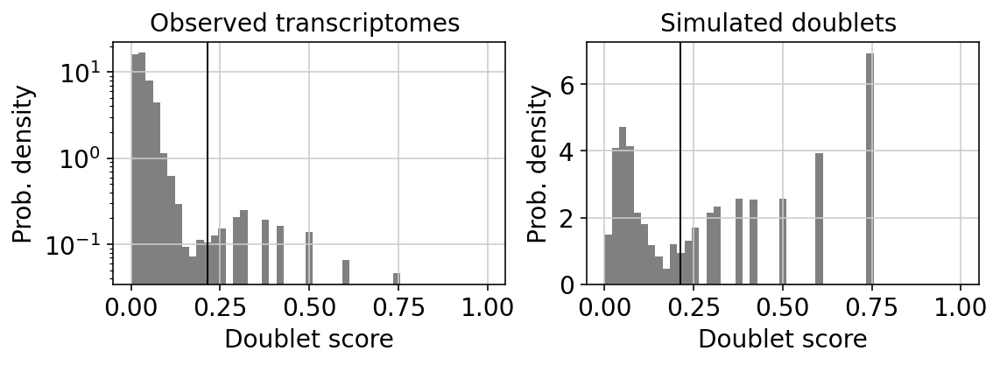

SN_MD5534b


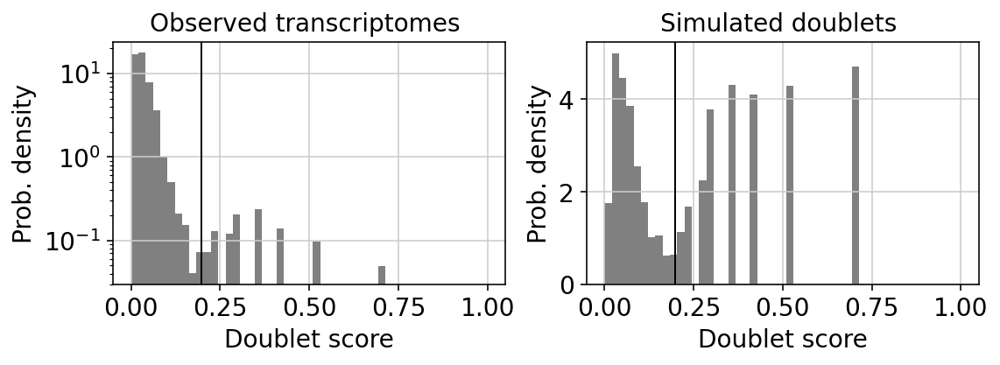

SN_MD5534c


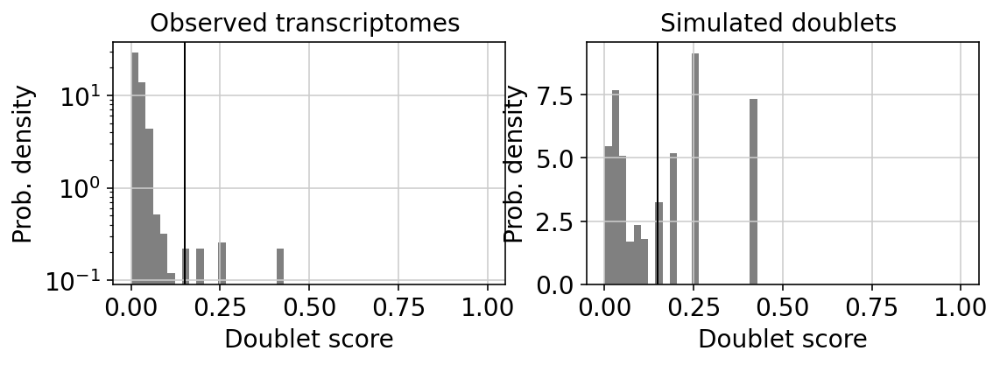

SN_MD5534d


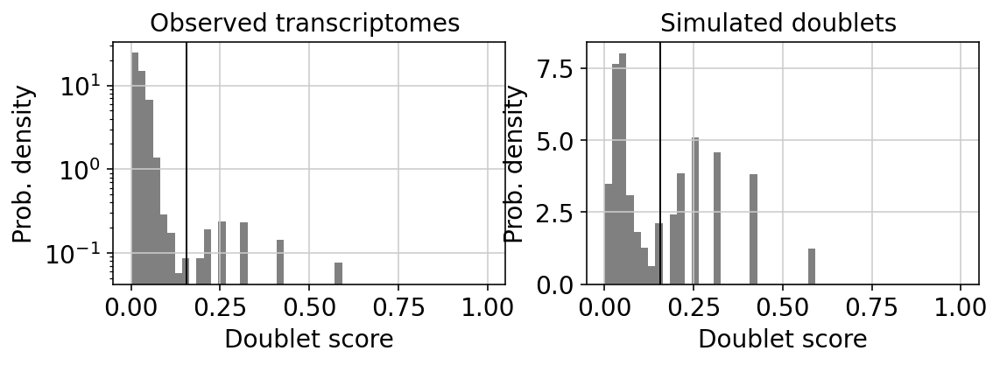

SN_MD5534e


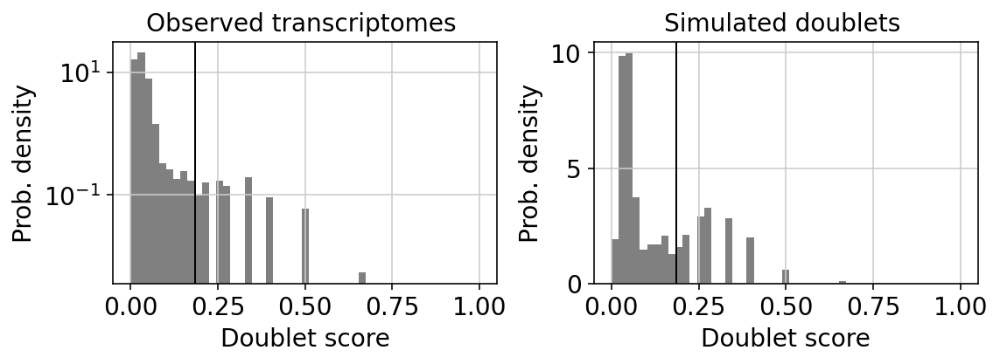

SN_MD5534f


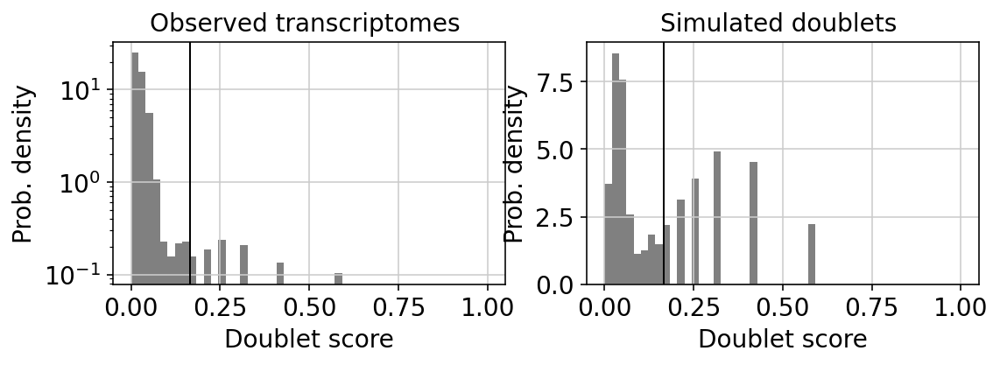

SN_MD5828a


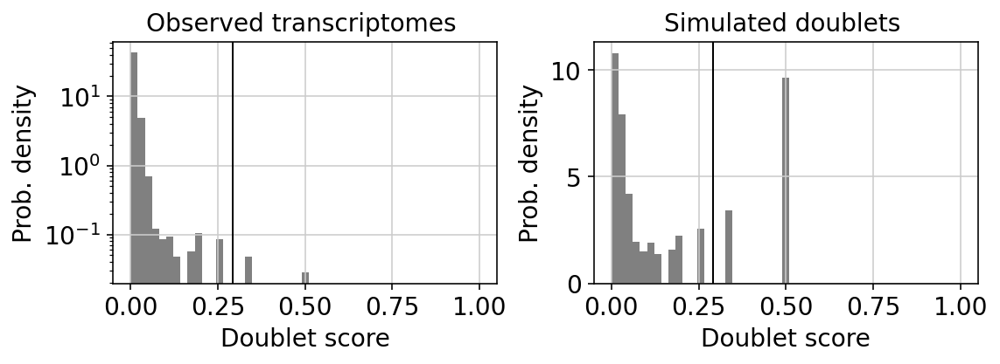

SN_MD5828b


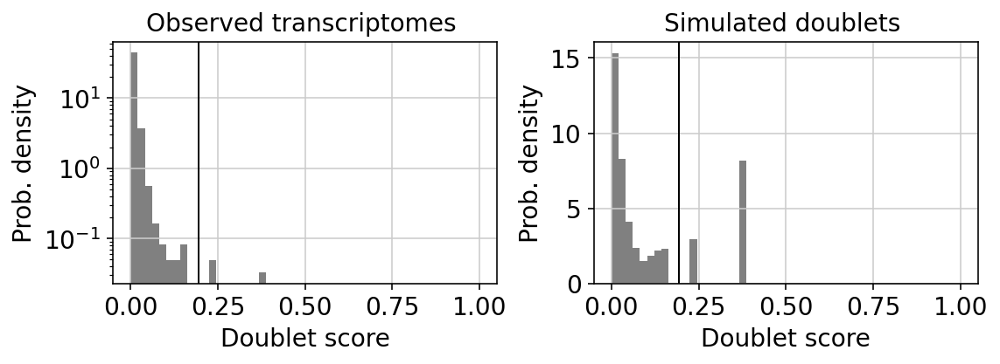

SN_MD5828c


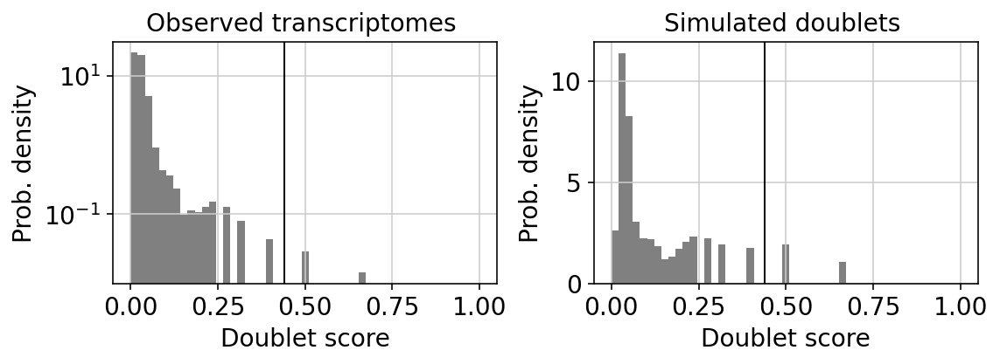

SN_MD5840a


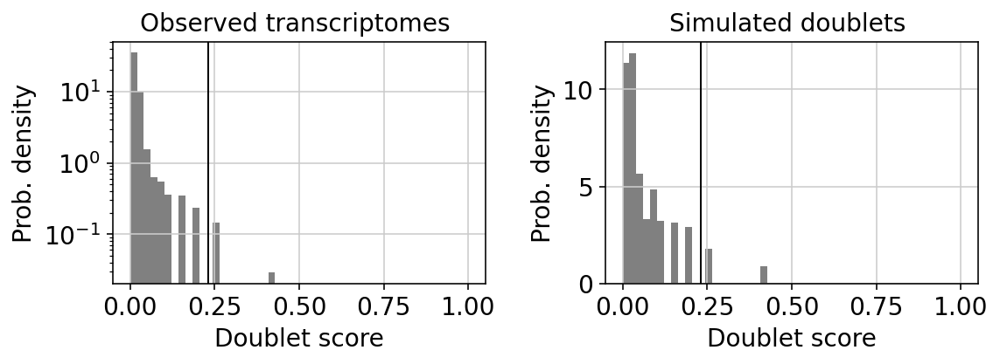

SN_MD5840b


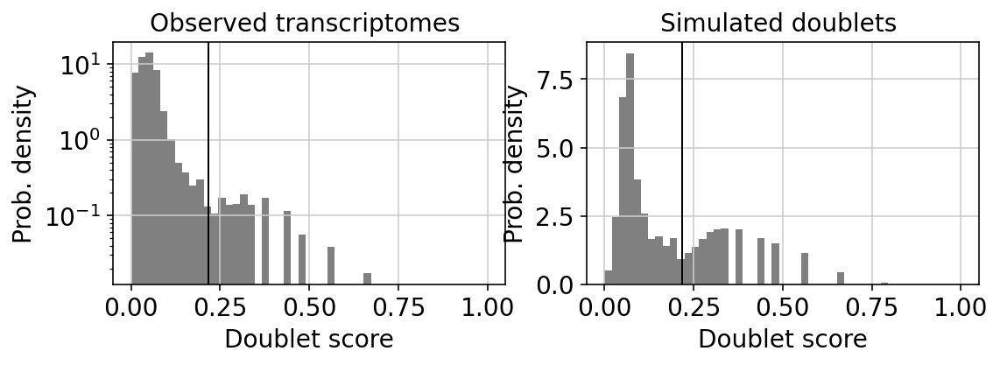

SN_MD5840c


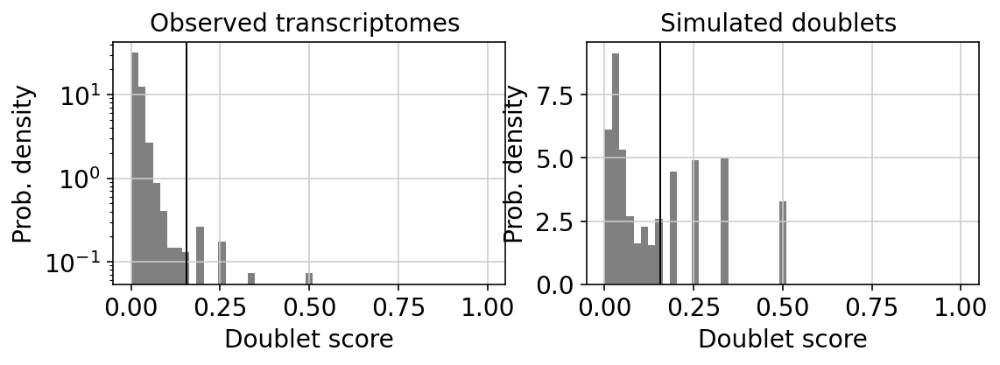

SN_MD5862a


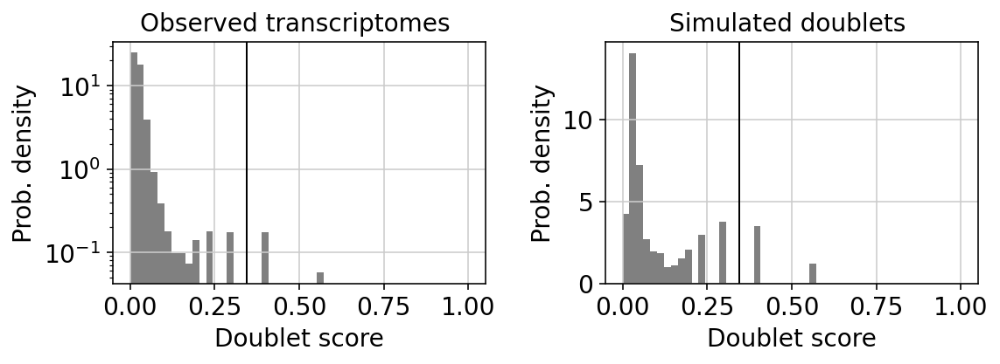

SN_MD5862b


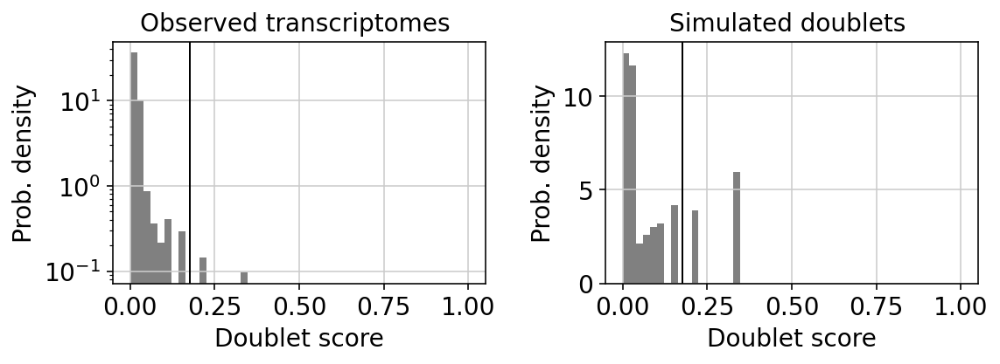

SN_MD5862c


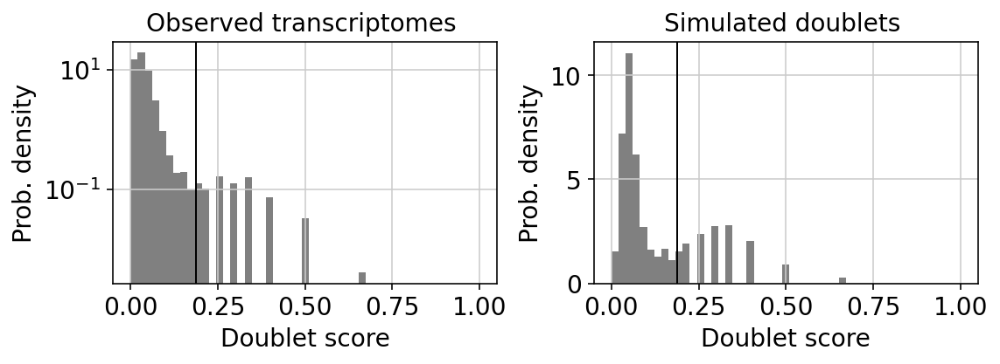

SN_MD5893a


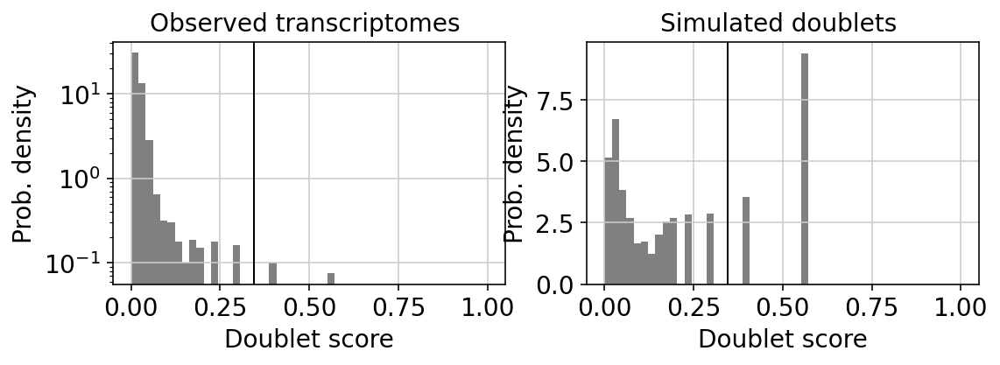

SN_MD5893b


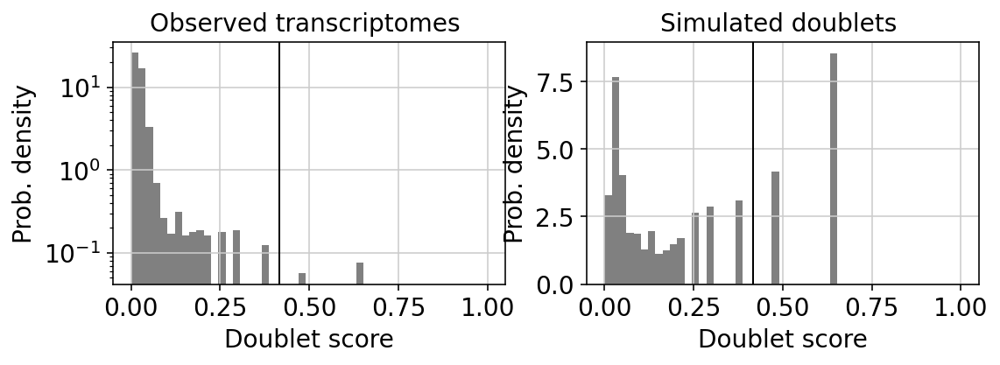

SN_MD5893c


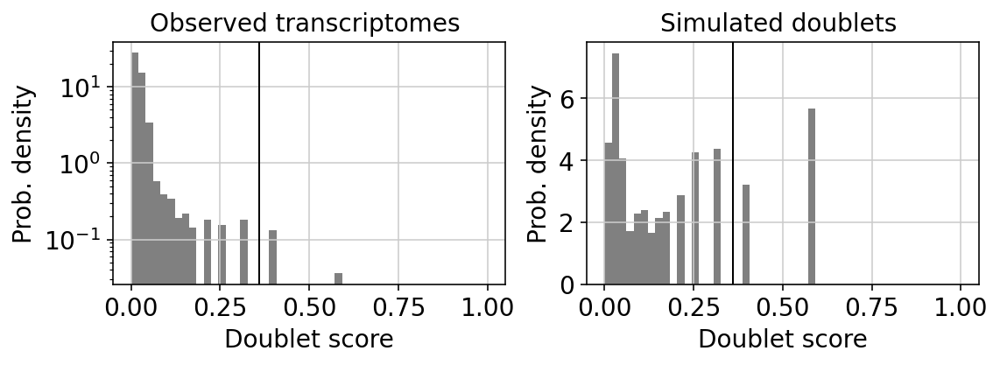

SN_MD6060a


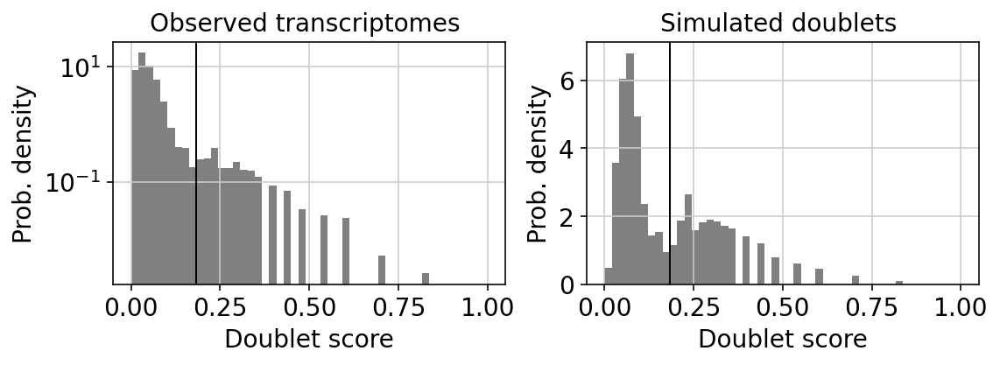

SN_MD6060b


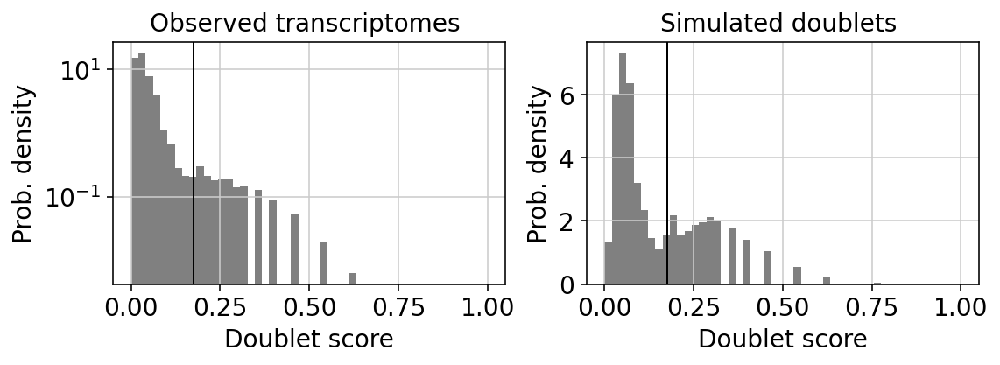

SN_MD6063a


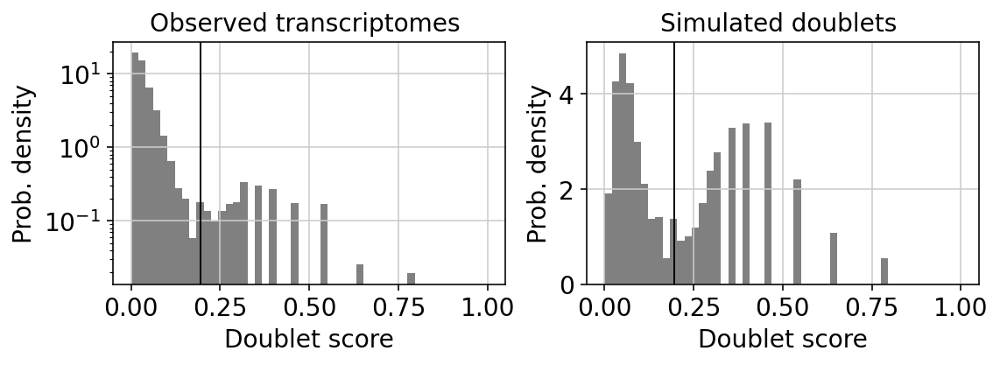

SN_MD6063b


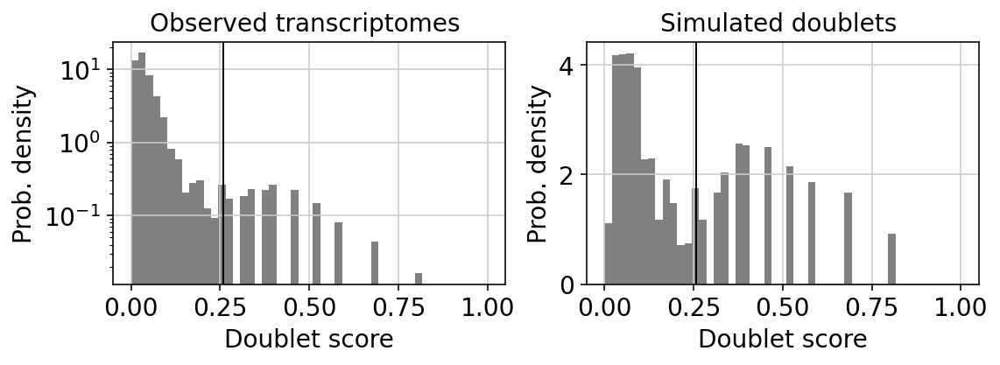

SN_MD6063c


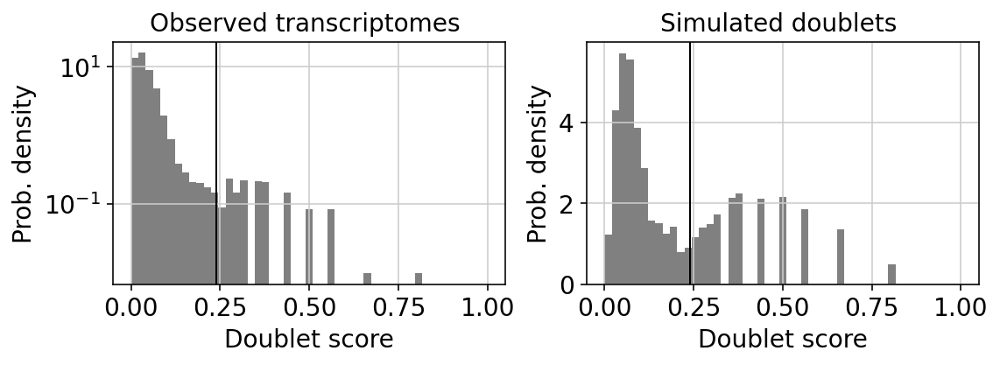

In [11]:
%matplotlib inline
for i in range(numberobj):
    print(names[i])
    sc.external.pl.scrublet_score_distribution(locals()[object_names[i]], scale_hist_obs='log', scale_hist_sim='linear', figsize=(8, 3),show=True,return_fig=True)

### Add QC and get rid of mitochondrial genes

<b> check this: sc.pp.calculate_qc_metrics() </b> <br>
expr_type: kind of values in X (str)<br>
var_type: kind of variables (str)<br>
qc_vars: keys for variables you want to control (collection of str)<br>
percent_top: proportions of top genes to cover, for cummulative proportion of counts (collection of int)<br>
layer: alternative layers for expression data (str)<br>
use_raw: use adata.raw.X for expression values (bool)<br>
inplace: place metrics in adata (bool)<br>
log1p: compute log1p transformed annotations, for very small values (bool)<br>
<br>
<b> return features obs </b> <br>
n_genes_by_counts: The number of genes with at least 1 count in a cell. <br>
total_counts: Total number of counts for a cell. <br>
total_counts_mt:Total number of mt gene counts for a cell. <br>
pct_counts_mt: Proportion (%) of total counts for a cell which are mitochondrial. <br> 
n_genes: Number of genes with a positive count. <br>
total_counts_ribo: Total number of ribosomal counts for a cell. <br>
pct_counts_ribo: Proportion of total counts for a cell which are ribosomal.

In [12]:
import numpy as np

for i in range(numberobj):
    #add mt variable annotation indicating if a gene is ribosomal or not (bool)
    if locals()[object_names[i]].obs['species'][0] == 'Homo sapien':
        locals()[object_names[i]].var['mt'] = locals()[object_names[i]].var_names.str.startswith('MT-')
    elif locals()[object_names[i]].obs['species'][0] == 'Mus musculus':
        locals()[object_names[i]].var['mt'] = locals()[object_names[i]].var_names.str.startswith('mt-') 
        
    if locals()[object_names[i]].obs['species'][0] == 'Homo sapien':
        locals()[object_names[i]].var['ribo'] = locals()[object_names[i]].var_names.str.startswith('RP')
    elif locals()[object_names[i]].obs['species'][0] == 'Mus musculus':
        locals()[object_names[i]].var['ribo'] = locals()[object_names[i]].var_names.str.startswith('Rp')
    
    sc.pp.calculate_qc_metrics(locals()[object_names[i]], expr_type='counts', var_type='genes', qc_vars=('mt','ribo'), percent_top= (), layer= None, use_raw= False, inplace=True, log1p=True)
     
    locals()[object_names[i]].var_names_make_unique()
    sc.pp.filter_cells(locals()[object_names[i]], min_genes=1) #remove all cells with 0 genes
                 
    # The following is to solve a save issue. Probably because of the NA valies in ther 'predicted_doublet' slot
    locals()[object_names[i]].obs['predicted_doublet'] =  locals()[object_names[i]].obs['predicted_doublet'].astype('str')

    

Checking median number of mitochondrial genes, genes and UMIs per cell to have an idea of the quality of each run:

In [14]:
print("Median numbers before filtering mt genes")
for i in range(numberobj):
    print(
         object_names[i],'\n',"\tmean mito%:",np.mean(locals()[object_names[i]].obs['pct_counts_mt']),'\n',
        "\tmedian genes/nuclei:",np.median(locals()[object_names[i]].obs['n_genes']),'\n', 
            "\tmedian reads/nuclei:",np.median(locals()[object_names[i]].obs['total_counts']),'\n',
           "\tmean genes/nuclei:",int(np.mean(locals()[object_names[i]].obs['n_genes'])),'\n',
         "\tmean reads/nuclei:",  int(np.mean(locals()[object_names[i]].obs['total_counts'])), '\n')
    

Median numbers before filtering mt genes
adata_SN_MD5534a 
 	mean mito%: 0.3231809298233811 
 	median genes/nuclei: 581.0 
 	median reads/nuclei: 719.0 
 	mean genes/nuclei: 673 
 	mean reads/nuclei: 922 

adata_SN_MD5534b 
 	mean mito%: 0.33917539767784105 
 	median genes/nuclei: 606.0 
 	median reads/nuclei: 766.0 
 	mean genes/nuclei: 672 
 	mean reads/nuclei: 924 

adata_SN_MD5534c 
 	mean mito%: 0.33730114572559305 
 	median genes/nuclei: 786.5 
 	median reads/nuclei: 1054.0 
 	mean genes/nuclei: 794 
 	mean reads/nuclei: 1111 

adata_SN_MD5534d 
 	mean mito%: 0.2687400123185637 
 	median genes/nuclei: 397.5 
 	median reads/nuclei: 478.5 
 	mean genes/nuclei: 526 
 	mean reads/nuclei: 719 

adata_SN_MD5534e 
 	mean mito%: 0.25386626841148485 
 	median genes/nuclei: 220.0 
 	median reads/nuclei: 254.0 
 	mean genes/nuclei: 381 
 	mean reads/nuclei: 506 

adata_SN_MD5534f 
 	mean mito%: 0.2633128005800287 
 	median genes/nuclei: 453.0 
 	median reads/nuclei: 561.0 
 	mean genes/nucl

Filtering out mito genes to determine number of non mitochondrial genes:

In [15]:
for i in range(numberobj):
    #list all non mitochondrial genes for subsetting the columns
    if locals()[object_names[i]].obs['species'][0] == 'Homo sapien':
         non_mito_genes_list = [name for name in locals()[object_names[i]].var_names if not name.startswith('MT-')]
    elif locals()[object_names[i]].obs['species'][0] == 'Mus musculus':
        non_mito_genes_list = [name for name in locals()[object_names[i]].var_names if not name.startswith('mt-')]
    
    
    locals()[object_names[i]] = locals()[object_names[i]][:, non_mito_genes_list].copy()
    
    locals()[object_names[i]].obs['total_counts_mito'] =  locals()[object_names[i]].obs['total_counts']
    
    
    #recalculate the number of genes, because some cells only had mt gene counts
    sc.pp.filter_cells(locals()[object_names[i]], min_genes=1)

### Recalculate metrics 
Note that the qc_vars=None because we want to keep the mt%."


In [16]:
for i in range(numberobj):
    sc.pp.calculate_qc_metrics(locals()[object_names[i]], expr_type='counts', var_type='genes', qc_vars=(), percent_top= (), layer= None, use_raw= False, inplace=True, log1p=True)

Check for the basic statistics

In [17]:
sc.set_figure_params(figsize=[8,8])

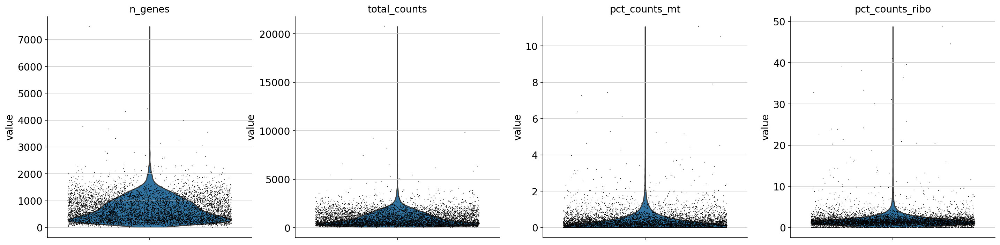

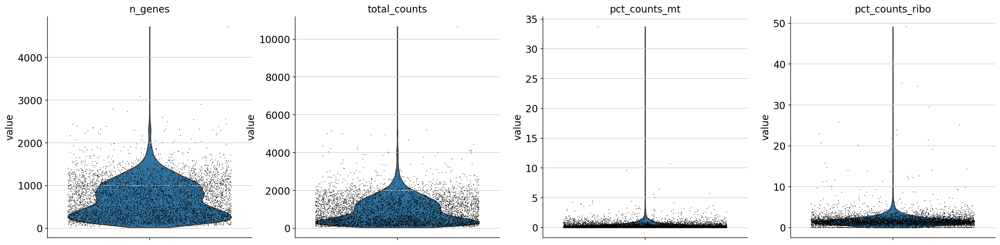

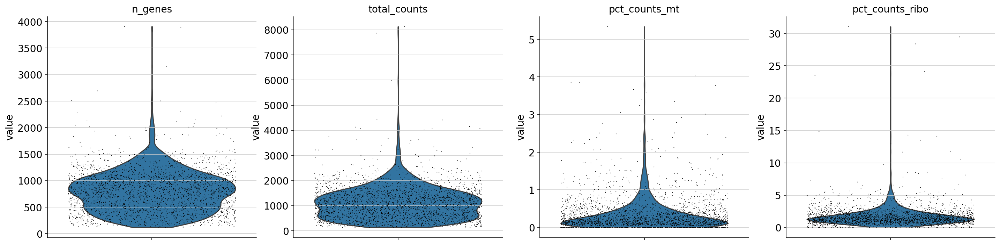

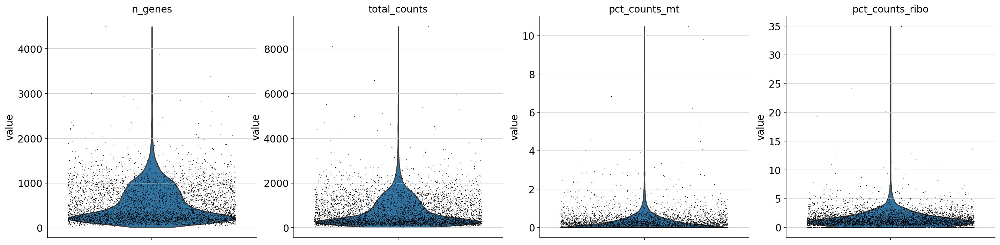

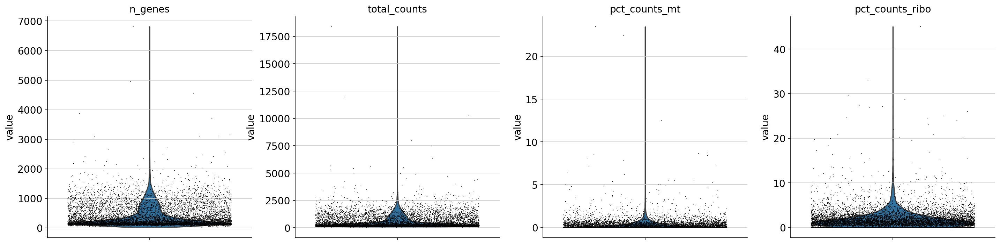

...

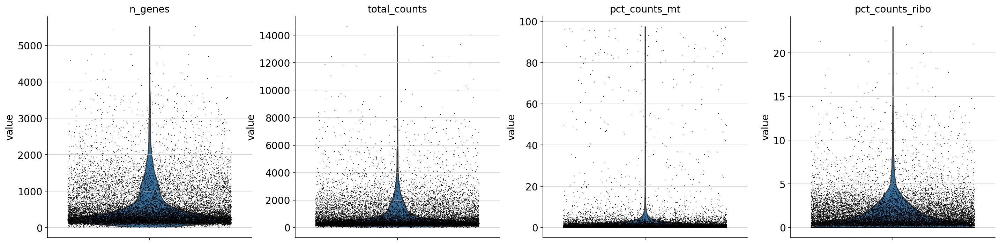

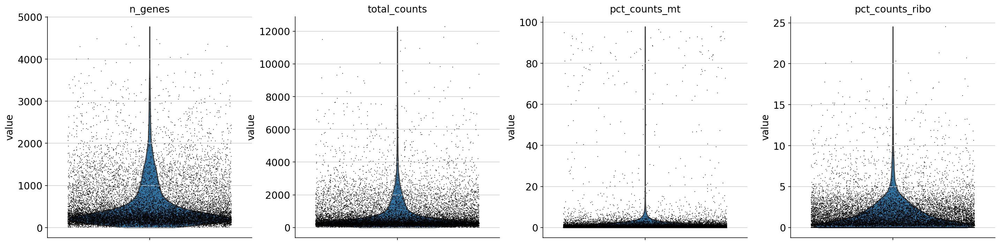

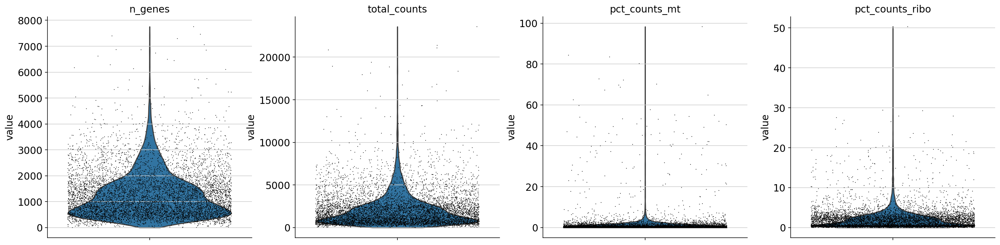

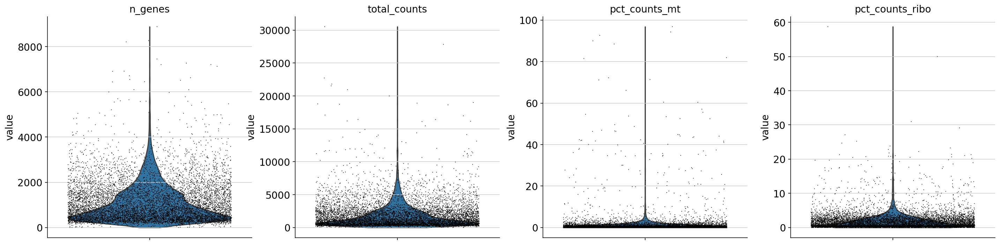

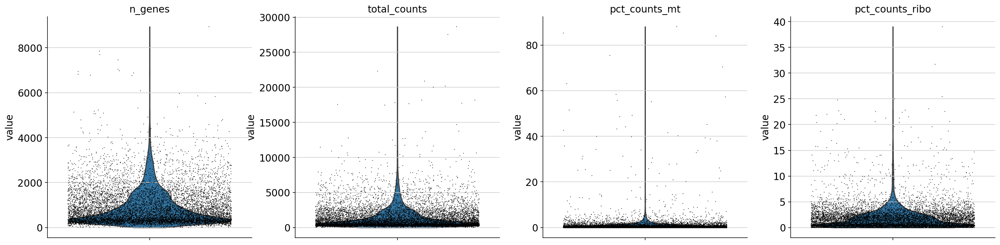

In [18]:
%matplotlib inline
for i in range(numberobj):
    sc.pl.violin(locals()[object_names[i]], ['n_genes', 'total_counts', 'pct_counts_mt','pct_counts_ribo'],
             jitter=0.4, multi_panel=True,size =1)#,save= object_names[i]+"_prefilter_all.pdf")
    plt.show()

In [19]:
print("Median numbers without mitochondrial reads\n")


for i in range(numberobj):
    median_counts = np.median(locals()[object_names[i]].obs['total_counts_mito'])
    mean_counts= int(np.mean(locals()[object_names[i]].obs['total_counts_mito']))

    median_counts_mito = np.median(locals()[object_names[i]].obs['total_counts']) 
    mean_counts_mito =int(np.mean(locals()[object_names[i]].obs['total_counts']))

    median_difference = median_counts - median_counts_mito 
    mean_difference = mean_counts -  mean_counts_mito
    
    pct_median_diff = median_difference / median_counts
    pct_mean_diff = mean_difference/mean_counts
    
    print(object_names[i],'\n',"\tmedian genes/nuclei:",np.median(locals()[object_names[i]].obs['n_genes']), '\n',
            "\tmedian reads/nuclei:",median_counts, '(',median_difference,'\t', pct_median_diff,'%',')','\n',
           "\tmean genes/nuclei:",int(np.mean(locals()[object_names[i]].obs['n_genes'])),'\n',
         "\tmean reads/nuclei:", mean_counts, '(',mean_difference,'\t', pct_mean_diff,'%',')','\n')

Median numbers without mitochondrial reads

adata_SN_MD5534a 
 	median genes/nuclei: 578.0 
 	median reads/nuclei: 719.0 ( 3.0 	 0.004172461752433936 % ) 
 	mean genes/nuclei: 671 
 	mean reads/nuclei: 922 ( 2 	 0.0021691973969631237 % ) 

adata_SN_MD5534b 
 	median genes/nuclei: 603.0 
 	median reads/nuclei: 766.0 ( 3.0 	 0.0039164490861618795 % ) 
 	mean genes/nuclei: 670 
 	mean reads/nuclei: 924 ( 3 	 0.003246753246753247 % ) 

adata_SN_MD5534c 
 	median genes/nuclei: 785.0 
 	median reads/nuclei: 1054.0 ( 3.0 	 0.0028462998102466793 % ) 
 	mean genes/nuclei: 792 
 	mean reads/nuclei: 1111 ( 3 	 0.0027002700270027003 % ) 

adata_SN_MD5534d 
 	median genes/nuclei: 396.0 
 	median reads/nuclei: 478.5 ( 1.5 	 0.003134796238244514 % ) 
 	mean genes/nuclei: 525 
 	mean reads/nuclei: 719 ( 2 	 0.0027816411682892906 % ) 

adata_SN_MD5534e 
 	median genes/nuclei: 220.0 
 	median reads/nuclei: 254.0 ( 1.0 	 0.003937007874015748 % ) 
 	mean genes/nuclei: 380 
 	mean reads/nuclei: 506 ( 1 	 0

### Save preprocessed files

In [20]:
for i in range(numberobj):
    locals()[object_names[i]].write(os.path.join('data/preprocessed_welch_'+object_names[i][6:]+'.h5ad'))

In [21]:
!ls data/

preprocessed_agarwal_GSM4157068.h5ad  preprocessed_smajic_SRR12621872.h5ad
preprocessed_agarwal_GSM4157069.h5ad  preprocessed_welch_SN_MD5534a.h5ad
preprocessed_agarwal_GSM4157070.h5ad  preprocessed_welch_SN_MD5534b.h5ad
preprocessed_agarwal_GSM4157072.h5ad  preprocessed_welch_SN_MD5534c.h5ad
preprocessed_agarwal_GSM4157074.h5ad  preprocessed_welch_SN_MD5534d.h5ad
preprocessed_agarwal_GSM4157076.h5ad  preprocessed_welch_SN_MD5534e.h5ad
preprocessed_agarwal_GSM4157078.h5ad  preprocessed_welch_SN_MD5534f.h5ad
preprocessed_altena_g004.h5ad	      preprocessed_welch_SN_MD5828a.h5ad
preprocessed_altena_g005.h5ad	      preprocessed_welch_SN_MD5828b.h5ad
preprocessed_altena_g011.h5ad	      preprocessed_welch_SN_MD5828c.h5ad
preprocessed_altena_g012.h5ad	      preprocessed_welch_SN_MD5840a.h5ad
preprocessed_altena_g013.h5ad	      preprocessed_welch_SN_MD5840b.h5ad
preprocessed_altena_g014.h5ad	      preprocessed_welch_SN_MD5840c.h5ad
preprocessed_altena_g015.h5ad	      preprocessed_welch_SN_MD5